In [1]:
# import packages

import scipy.io as sio  # for loading matlab data
import os
import numpy as np      # for numerical libs
import pandas as pd

from matplotlib.ticker import FuncFormatter # for custom bar plot labels

import matplotlib.pyplot as plt  # for plotting

from scipy import stats
from statsmodels.regression import linear_model

import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)
from statsmodels.tsa import stattools

LOAD DATA

In [2]:
"""data_folder = "./GOOG"
data_GOOG = []
for file in os.listdir(data_folder):
    file_loc = "%s/%s" % (data_folder, file)
    data_GOOG.append( sio.loadmat(file_loc) )"""

t = np.array([])
bid_GOOG = np.array([])
bidvol_GOOG = np.array([])
ask_GOOG = np.array([])
askvol_GOOG = np.array([])
nMO_GOOG = np.array([])
vMO_GOOG = np.array([])
MO_GOOG = np.array([])

for i in range(3,27):
    if i <10:
        file_loc = "./Nov-2014/GOOG_2014110%i.mat" % (i)
        if os.path.exists(file_loc):
            tmp = sio.loadmat(file_loc)
            tmp_lob = tmp['LOB']

            t = np.append(t, (np.array((tmp_lob['EventTime'][0][0][:,0]))-3600000*9.5)*1e-3 )#time in seconds, measured from NASDAQ opening at 9:30am
            bid_GOOG = np.append(bid_GOOG, np.array(tmp_lob['BuyPrice'][0][0]*1e-4))
            bidvol_GOOG = np.append(bidvol_GOOG,np.array(tmp_lob['BuyVolume'][0][0]*1.0))
            ask_GOOG = np.append(ask_GOOG,np.array(tmp_lob['SellPrice'][0][0]*1e-4))
            askvol_GOOG = np.append(askvol_GOOG,np.array(tmp_lob['SellVolume'][0][0]*1.0))
            nMO_GOOG = np.append(nMO_GOOG,np.array(tmp_lob['NumberMO'][0][0]*1.0))#total number of MOs submitted in the given 0.1 second interval
            vMO_GOOG = np.append(vMO_GOOG,np.array(tmp_lob['VolumeMO'][0][0]*1.0))#total volume of MOs submitted in the given 0.1 second interval
            MO_GOOG=np.append(MO_GOOG,np.array(tmp_lob['MO'][0][0]*1.0))#information about market orders
    else:
        file_loc = "./Nov-2014/GOOG_201411%i.mat" % (i)
        if os.path.exists(file_loc):
            tmp = sio.loadmat(file_loc)
            tmp_lob = tmp['LOB']

            t = np.append(t, (np.array((tmp_lob['EventTime'][0][0][:,0]))-3600000*9.5)*1e-3 )#time in seconds, measured from NASDAQ opening at 9:30am
            bid_GOOG = np.append(bid_GOOG, np.array(tmp_lob['BuyPrice'][0][0]*1e-4))
            bidvol_GOOG = np.append(bidvol_GOOG,np.array(tmp_lob['BuyVolume'][0][0]*1.0))
            ask_GOOG = np.append(ask_GOOG,np.array(tmp_lob['SellPrice'][0][0]*1e-4))
            askvol_GOOG = np.append(askvol_GOOG,np.array(tmp_lob['SellVolume'][0][0]*1.0))
            nMO_GOOG = np.append(nMO_GOOG,np.array(tmp_lob['NumberMO'][0][0]*1.0))#total number of MOs submitted in the given 0.1 second interval
            vMO_GOOG = np.append(vMO_GOOG,np.array(tmp_lob['VolumeMO'][0][0]*1.0))#total volume of MOs submitted in the given 0.1 second interval
            MO_GOOG=np.append(MO_GOOG,np.array(tmp_lob['MO'][0][0]*1.0))#information about market orders
    #print(file_loc)
#print(bid_MSFT[0,50])
print(bid_GOOG)

[551.41 551.11 549.   ... 539.59 539.57 539.55]


In [3]:
t = np.array([])
bid_MSFT = np.array([])
bidvol_MSFT = np.array([])
ask_MSFT = np.array([])
askvol_MSFT = np.array([])
nMO_MSFT = np.array([])
vMO_MSFT = np.array([])
MO_MSFT = np.array([])

for i in range(3,27):
    if i <10:
        file_loc = "./Nov-2014/MSFT_2014110%i.mat" % (i)
        if os.path.exists(file_loc):
            tmp = sio.loadmat(file_loc)
            tmp_lob = tmp['LOB']

            t = np.append(t, (np.array((tmp_lob['EventTime'][0][0][:,0]))-3600000*9.5)*1e-3 )#time in seconds, measured from NASDAQ opening at 9:30am
            bid_MSFT = np.append(bid_MSFT, np.array(tmp_lob['BuyPrice'][0][0]*1e-4))
            bidvol_MSFT = np.append(bidvol_MSFT,np.array(tmp_lob['BuyVolume'][0][0]*1.0))
            ask_MSFT = np.append(ask_MSFT,np.array(tmp_lob['SellPrice'][0][0]*1e-4))
            askvol_MSFT = np.append(askvol_MSFT,np.array(tmp_lob['SellVolume'][0][0]*1.0))
            nMO_MSFT = np.append(nMO_MSFT,np.array(tmp_lob['NumberMO'][0][0]*1.0))#total number of MOs submitted in the given 0.1 second interval
            vMO_MSFT = np.append(vMO_MSFT,np.array(tmp_lob['VolumeMO'][0][0]*1.0))#total volume of MOs submitted in the given 0.1 second interval
            MO_MSFT=np.append(MO_MSFT,np.array(tmp_lob['MO'][0][0]*1.0))#information about market orders
    else:
        file_loc = "./Nov-2014/MSFT_201411%i.mat" % (i)
        if os.path.exists(file_loc):
            tmp = sio.loadmat(file_loc)
            tmp_lob = tmp['LOB']

            t = np.append(t, (np.array((tmp_lob['EventTime'][0][0][:,0]))-3600000*9.5)*1e-3 )#time in seconds, measured from NASDAQ opening at 9:30am
            bid_MSFT = np.append(bid_MSFT, np.array(tmp_lob['BuyPrice'][0][0]*1e-4))
            bidvol_MSFT = np.append(bidvol_MSFT,np.array(tmp_lob['BuyVolume'][0][0]*1.0))
            ask_MSFT = np.append(ask_MSFT,np.array(tmp_lob['SellPrice'][0][0]*1e-4))
            askvol_MSFT = np.append(askvol_MSFT,np.array(tmp_lob['SellVolume'][0][0]*1.0))
            nMO_MSFT = np.append(nMO_MSFT,np.array(tmp_lob['NumberMO'][0][0]*1.0))#total number of MOs submitted in the given 0.1 second interval
            vMO_MSFT = np.append(vMO_MSFT,np.array(tmp_lob['VolumeMO'][0][0]*1.0))#total volume of MOs submitted in the given 0.1 second interval
            MO_MSFT=np.append(MO_MSFT,np.array(tmp_lob['MO'][0][0]*1.0))#information about market orders
    #print(file_loc)
#print(bid_MSFT[0,50])
print(bid_MSFT)

[46.73 46.71 46.64 ... 47.58 47.57 47.56]


In [4]:
# The previous sections enabled me to get the data through all days into one list:

# Let's use the same format as in the code examples: different rows of 20 elements
# Instead of having just one day, we will have all the days till Nov.26
#LOs

bid_MSFT_tab = bid_MSFT.reshape(len(bid_MSFT)//20,20)
bidvol_MSFT_tab = bidvol_MSFT.reshape(len(bidvol_MSFT)//20,20)
ask_MSFT_tab = ask_MSFT.reshape(len(ask_MSFT)//20,20)
askvol_MSFT_tab = askvol_MSFT.reshape(len(askvol_MSFT)//20,20)

bid_GOOG_tab = bid_GOOG.reshape(len(bid_GOOG)//20,20)
bidvol_GOOG_tab = bidvol_GOOG.reshape(len(bidvol_GOOG)//20,20)
ask_GOOG_tab = ask_GOOG.reshape(len(ask_GOOG)//20,20)
askvol_GOOG_tab = askvol_GOOG.reshape(len(askvol_GOOG)//20,20)

#print(len(askvol_MSFT_tab[:,0]))

In [5]:
print(len(bid_MSFT_tab[0,:]))

20


In [6]:
# MOs
nMO_MSFT_tab = nMO_MSFT.reshape(len(nMO_MSFT)//2,2)
vMO_MSFT_tab = vMO_MSFT.reshape(len(vMO_MSFT)//2,2)
MO_MSFT_tab =  MO_MSFT.reshape(len(MO_MSFT)//50,50)

nMO_GOOG_tab = nMO_GOOG.reshape(len(nMO_GOOG)//2,2)
vMO_GOOG_tab = vMO_GOOG.reshape(len(vMO_GOOG)//2,2)
MO_GOOG_tab =  MO_GOOG.reshape(len(MO_GOOG)//50,50)

#print(nMO_GOOG_tab)
#print(vMO_GOOG_tab)
print((vMO_GOOG_tab[:,1]))

[  0.   0.   0. ...   0.   0. 480.]


Question 1A

Signed Traded Volume

In [7]:
delta_t = 10 # use of a reduced frequency sample
freq = 10
ind1=10*60*30
ind2=10*60*(30+11*30)

In [8]:
#order flow as a function of time: MSFT
OF_MSFT = np.cumsum(vMO_MSFT_tab[:,0])-np.cumsum(vMO_MSFT_tab[:,1])

OF_MSFT_1 = OF_MSFT
OF1_MSFT_centered = OF_MSFT_1-np.mean(OF_MSFT_1)
OF_MSFT_final = OF1_MSFT_centered[::freq]
#print(len(OF_MSFT_final))

OF_MSFT_inc = []
for i in range(23400,len(OF_MSFT_final),23400): # Loop necessary to differentiate on each day separately (234000 values per day/taken each 10)
    tmp1 = np.diff(OF_MSFT_final[i-23400:i])
    OF_MSFT_inc.append(tmp1)

OF_MSFT_inc = np.array(OF_MSFT_inc)
#print(OF_MSFT_inc)

tab_MSFT_OF = np.array([])
for i in range(len(OF_MSFT_inc)):
    tab_MSFT_OF = np.append(tab_MSFT_OF, OF_MSFT_inc[i])

#print(tab_MSFT_OF)

In [9]:
#order flow as a function of time: GOOG
OF_GOOG = np.cumsum(vMO_GOOG_tab[:,0])-np.cumsum(vMO_GOOG_tab[:,1])

OF_GOOG_1 = OF_GOOG
OF1_GOOG_centered = OF_GOOG_1-np.mean(OF_GOOG_1)
OF_GOOG_final = OF1_GOOG_centered[::freq]

OF_GOOG_inc = []
for i in range(23400,len(OF_GOOG_final),23400): # Loop necessary to differentiate on each day separately
    tmp2 = np.diff(OF_GOOG_final[i-23400:i])
    OF_GOOG_inc.append(tmp2)

OF_GOOG_inc = np.array(OF_GOOG_inc)
#print(OF_MSFT_inc)

tab_GOOG_OF = np.array([])
for i in range(len(OF_GOOG_inc)):
    tab_GOOG_OF = np.append(tab_GOOG_OF, OF_GOOG_inc[i])

#print(tab_MSFT_OF)

Midprices

In [10]:
midprice_MSFT_LOB = 0.5*(bid_MSFT_tab[:,0]+ask_MSFT_tab[:,0])

price_MSFT_LOB = midprice_MSFT_LOB
price_inc_MSFT_LOB = price_MSFT_LOB[::freq]
price_inc_MSFT_LOB_tab = []
for i in range(23400,len(price_inc_MSFT_LOB),23400):# Loop necessary to differentiate on each day separately
    tmp_midprice_MSFT = np.diff(price_inc_MSFT_LOB[i-23400:i])
    price_inc_MSFT_LOB_tab.append(tmp_midprice_MSFT)

price_inc_MSFT_LOB_tab = np.array(price_inc_MSFT_LOB_tab)
#print(price_inc_MSFT_LOB_tab)

tab_MSFT_midprice_fin = np.array([])
for i in range(len(OF_GOOG_inc)):# Loop necessary to differentiate on each day separately
    tab_MSFT_midprice_fin = np.append(tab_MSFT_midprice_fin, price_inc_MSFT_LOB_tab[i])
spread_MSFT_LOB = ask_MSFT_tab[:,0]-bid_MSFT_tab[:,0]


midprice_GOOG_LOB = 0.5*(bid_GOOG_tab[:,0]+ask_GOOG_tab[:,0])

price_GOOG_LOB = midprice_GOOG_LOB
price_inc_GOOG_LOB = price_GOOG_LOB[::freq]
price_inc_GOOG_LOB_tab = []
for i in range(23400,len(price_inc_GOOG_LOB),23400): # Let's put everything into one list
    tmp_midprice_GOOG = np.diff(price_inc_GOOG_LOB[i-23400:i])
    price_inc_GOOG_LOB_tab.append(tmp_midprice_GOOG)

price_inc_GOOG_LOB_tab = np.array(price_inc_GOOG_LOB_tab)
#print(price_inc_MSFT_LOB_tab)

tab_GOOG_midprice_fin = np.array([])
for i in range(len(OF_GOOG_inc)):
    tab_GOOG_midprice_fin = np.append(tab_GOOG_midprice_fin, price_inc_GOOG_LOB_tab[i])

spread_MSFT_LOB = ask_MSFT_tab[:,0]-bid_MSFT_tab[:,0]

Price Impact Coefficient

Lambda MSFT:  9.214861900707318e-07
0.0
0.1544711588745847


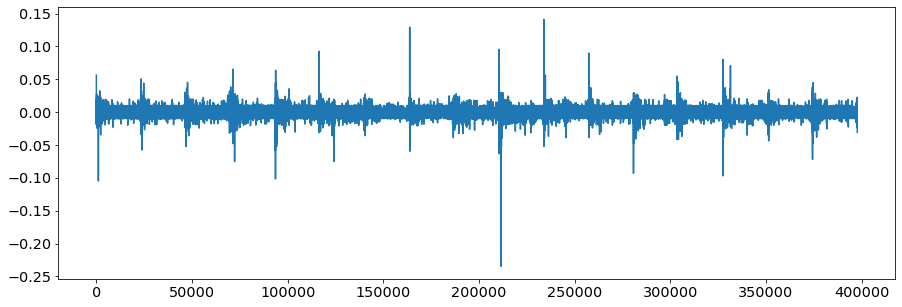

In [11]:
#regress the increments of price on the increments of OF
slope_MSFT, intercept, r_value, p_value, std_err = stats.linregress(tab_MSFT_OF,tab_MSFT_midprice_fin)
print("Lambda MSFT: ",slope_MSFT)
print(p_value)
print(r_value**2)
res = [tab_MSFT_midprice_fin[i] - slope_MSFT*tab_MSFT_OF[i] - intercept for i in range(len(tab_MSFT_midprice_fin))]
plt.plot(res)

Lambda GOOG:  0.00011190949004852417
0.0
0.13328747383339476


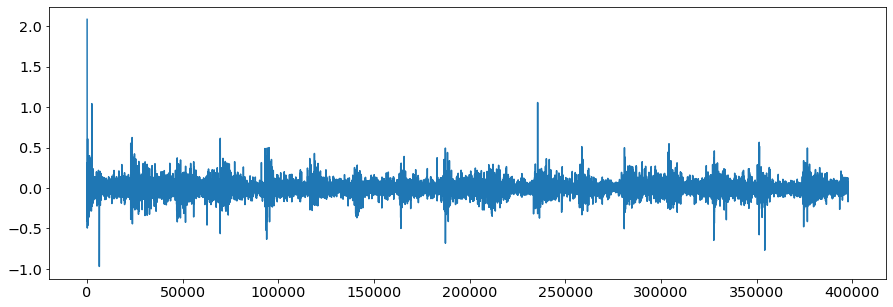

In [12]:
slope_GOOG, intercept, r_value, p_value, std_err = stats.linregress(tab_GOOG_OF,tab_GOOG_midprice_fin)
print("Lambda GOOG: ",slope_GOOG)
print(p_value)
print(r_value**2)
res = [tab_GOOG_midprice_fin[i] - slope_GOOG*tab_GOOG_OF[i] - intercept for i in range(len(tab_GOOG_midprice_fin))]
plt.plot(res)

Question 1B

In [13]:
askvol_MSFT_1b = askvol_MSFT_tab[:,:10]
bidvol_MSFT_1b = bidvol_MSFT_tab[:,:10]
# Height of the latter LOB on the bid side:
sum_ask_volumes_MSFT = []
sum_bid_volumes_MSFT = []
H_t_bid = []
H_t_ask = []

for i in range(len(askvol_MSFT_1b)):
    sum_ask_volumes_MSFT.append(np.sum(askvol_MSFT_1b[i]))
    sum_bid_volumes_MSFT.append(np.sum(bidvol_MSFT_1b[i]))

for i in range(len(midprice_MSFT_LOB)):
    temp_bid = (1/(midprice_MSFT_LOB[i]-bid_MSFT_tab[i,9]))*sum_bid_volumes_MSFT[i]
    temp_ask = (1/(ask_MSFT_tab[i,9]-midprice_MSFT_LOB[i]))*sum_ask_volumes_MSFT[i]
    H_t_bid.append(temp_bid)
    H_t_ask.append(temp_ask)

In [14]:
askvol_GOOG_1b = askvol_GOOG_tab[:,:10]
bidvol_GOOG_1b = bidvol_GOOG_tab[:,:10]
# Height of the latter LOB on the bid side:
sum_ask_volumes_GOOG = []
sum_bid_volumes_GOOG = []
H_t_bid_GOOG = []
H_t_ask_GOOG = []

for i in range(len(askvol_GOOG_1b)):
    sum_ask_volumes_GOOG.append(np.sum(askvol_GOOG_1b[i]))
    sum_bid_volumes_GOOG.append(np.sum(bidvol_GOOG_1b[i]))

for i in range(len(midprice_MSFT_LOB)):
    temp_bid_GOOG = (1/(midprice_GOOG_LOB[i]-bid_GOOG_tab[i,9]))*sum_bid_volumes_GOOG[i]
    temp_ask_GOOG = (1/(ask_GOOG_tab[i,9]-midprice_GOOG_LOB[i]))*sum_ask_volumes_GOOG[i]
    H_t_bid_GOOG.append(temp_bid_GOOG)
    H_t_ask_GOOG.append(temp_ask_GOOG)


In [15]:
price_impact_tab_MSFT = []
price_impact_tab_GOOG = []
for i in range(len(H_t_bid)):
    temp = 0.5*((1/H_t_bid[i])+(1/H_t_ask[i]))
    temp_GOOG = 0.5*((1/H_t_bid_GOOG[i])+(1/H_t_ask_GOOG[i]))
    price_impact_tab_MSFT.append(temp)
    price_impact_tab_GOOG.append(temp_GOOG)

In [16]:
lambda_MSFT = np.sum(price_impact_tab_MSFT)/len(price_impact_tab_MSFT)
lambda_GOOG = np.sum(price_impact_tab_GOOG)/len(price_impact_tab_GOOG)

In [17]:
print("lambda_MSFT: ",lambda_MSFT)
print("lambda_GOOG: ",lambda_GOOG)

lambda_MSFT:  1.8392754266359228e-06
lambda_GOOG:  0.0002836755634814247


Question 1C

In [18]:
# 5 minutes --> 10*60*5
# We need the following increments: S((i+1)h) - S(ih)

tab_increments_midprice_MSFT = []
tab_increments_midprice_GOOG = []
for i in range(len(midprice_MSFT_LOB)//3000):
    tmp_MSFT = midprice_MSFT_LOB[2999*(i+1)]-midprice_MSFT_LOB[2999*i]
    tmp_GOOG = midprice_GOOG_LOB[2999*(i+1)]-midprice_GOOG_LOB[2999*i]
    tab_increments_midprice_MSFT.append(tmp_MSFT)
    tab_increments_midprice_GOOG.append(tmp_GOOG)

In [19]:
sigma_MSFT = np.std(tab_increments_midprice_MSFT)
sigma_GOOG = np.std(tab_increments_midprice_GOOG)

In [20]:
print("Variance of MSFT",sigma_MSFT**2)
print("Variance of GOOG",sigma_GOOG**2)

Variance of MSFT 0.002136821370666654
Variance of GOOG 0.2721184341543484


Question 1D

In [21]:
risk_aversion_MSFT = slope_MSFT/(2*(sigma_MSFT)**2)
risk_aversion_GOOG = slope_GOOG/(2*(sigma_GOOG)**2)
risk_aversion_MSFT_1B = lambda_MSFT/(2*(sigma_MSFT)**2)
risk_aversion_GOOG_1B = lambda_GOOG/(2*(sigma_GOOG)**2)

print("Risk aversion obtained from MSFT data and 1A: ",risk_aversion_MSFT)
print("Risk aversion obtained from GOOG data and 1A: ",risk_aversion_GOOG)
print()
print("Risk aversion obtained from MSFT data and 1B: ",risk_aversion_MSFT_1B)
print("Risk aversion obtained from GOOG data and 1B: ",risk_aversion_GOOG_1B)

Risk aversion obtained from MSFT data and 1A:  0.0002156207820458204
Risk aversion obtained from GOOG data and 1A:  0.0002056264405539096

Risk aversion obtained from MSFT data and 1B:  0.0004303765050005322
Risk aversion obtained from GOOG data and 1B:  0.0005212354766831434


--------------------------------------------------------------------------------------------------------------------------------------------------------------

Problem 2

--------------------------------------------------------------------------------------------------------------------------------------------------------------

In [22]:
data = sio.loadmat('MSFT_20141103.mat')
LOB=data['LOB']

t = (np.array((LOB['EventTime'][0][0][:,0]))-3600000*9.5)*1e-3#time in seconds, measured from NASDAQ opening at 9:30am
bid = np.array(LOB['BuyPrice'][0][0]*1e-4)
bidvol = np.array(LOB['BuyVolume'][0][0]*1.0)
ask = np.array(LOB['SellPrice'][0][0]*1e-4)
askvol = np.array(LOB['SellVolume'][0][0]*1.0)
nMO = np.array(LOB['NumberMO'][0][0]*1.0)#total number of MOs submitted in the given 0.1 second interval
vMO = np.array(LOB['VolumeMO'][0][0]*1.0)#total volume of MOs submitted in the given 0.1 second interval
MO=np.array(LOB['MO'][0][0]*1.0)#information about market orders

In [23]:
# Parameters
q = 100                     #Number of shares +|-
N = 10*60                   #Length of estimation window
stop_loss_time = 10*10      #Length of prediction interval
tP_star = 0.00999
lP_star = 0.00999
p_star1 = 0.01
p_star2 = 0.05
t_10_01 = (31*10*60)-1          #time for 10:01 am
t_30_min = 30*10*60             #30 minutes
alpha_star = 0.005
PnL = [0]

In [24]:
# Microprice
midprice = 0.5*(bid[:,0]+ask[:,0])
midprice_trade = midprice[t_10_01:]      #Trading time range: 10:01am - 3:30pm
# Order Flow
order_flow = np.sum(bidvol[:,:10],axis=1)-np.sum(askvol[:,:10],axis=1) # order flow: we take the first 10 columns
#print(order_flow)

In [25]:
tab_follow_up = np.zeros(shape=(1,6))
df = pd.DataFrame(tab_follow_up)
df.columns =['Open/Close', 'Long/Short','Time opening', 'Time Holding','Best Ask opening','Best Bid Opening']
print(df)
#print(df.iat[0,0])

   Open/Close  Long/Short  Time opening  Time Holding  Best Ask opening  \
0         0.0         0.0           0.0           0.0               0.0   

   Best Bid Opening  
0               0.0  


In [26]:
tab_debugging_index = []
tab_debugging_pos = []

for i in range(t_10_01,len(midprice)-t_30_min):
#for i in range(t_10_01,25000):
    print('Percentage of execution: ', i/len(midprice))
    if df.iat[0,0]==1 and df.iat[0,1]==1:   # Opened Long position
        if (bid[i,0]-df.iat[0,5]>=tP_star) or (ask[i,0]-df.iat[0,4]<= -lP_star) or (i-df.iat[0,2]>stop_loss_time):
            PnL.append(PnL[-1]+q*(ask[i,0]-df.iat[0,4]))
            df.iat[0,0]=0
            df.iat[0,1]=0
            df.iat[0,2]=0
            df.iat[0,3]=0
            df.iat[0,4]=0
            df.iat[0,5]=0
            continue
        else:
            df.iat[0,3]+=1          # holding time incremented
            PnL.append(PnL[-1])

    if df.iat[0,0]==1 and df.iat[0,1]==2:   # Opened Short position
        if (ask[i,0]-df.iat[0,4]<=-tP_star) or (bid[i,0]-df.iat[0,5]>= lP_star) or (i-df.iat[0,2]>stop_loss_time):
            PnL.append(PnL[-1]-q*(bid[i,0]-df.iat[0,5]))
            df.iat[0,0]=0
            df.iat[0,1]=0
            df.iat[0,2]=0
            df.iat[0,3]=0
            df.iat[0,4]=0
            df.iat[0,5]=0
            continue
        else:
            df.iat[0,3]+=1          # holding time incremented
            PnL.append(PnL[-1])

    if df.iat[0,0]==0: # no position at time t
        #print(i)
        time_estimation = t[i-N:i]              # Backtesting on the previous minute: estimation window
        sample_time = time_estimation[::10]     # Focus on every 10th entry

        estimation_midprice = midprice[i-N:i]   # Backtesting on the previous minute: estimation window
        S_hat = estimation_midprice[::10]       # Focus on every 10th entry
        S_tilde = estimation_midprice - np.mean(estimation_midprice)    # Centered process
        S_tilde = S_tilde[::10]                                         # Focus on every 10th entry

        estimation_OF = order_flow[i-N:i]
        OF_hat = estimation_OF[::10]
        OF_tilde = estimation_OF - np.mean(estimation_OF)
        OF_tilde = OF_tilde[::10]

        phi, sigma = linear_model.yule_walker(OF_tilde,order=1)     # Yules-Walker equation
        my_DF = stattools.adfuller(OF_tilde,1,'c',None)             # Dickey-Fuller test
        p_value1 = (my_DF[1])
        #print(phi[0]) #phi_1

        lambda_reg, intercept, r_value, p_value2, std_err = stats.linregress(np.diff(OF_hat),np.diff(S_hat))
        midprice_inc = np.diff(S_hat)
        OF_increment = np.diff(OF_hat)
        res = [midprice_inc[i] - lambda_reg*OF_increment[i] - intercept for i in range(len(midprice_inc))]
        sigma_hat = np.std(res)       # sigma_hat computation

        if p_value1<p_star1 and p_value2<p_star2 and lambda_reg>0:
            #print(i)
            tab_debugging_index.append(i)
            alpha = -lambda_reg*OF_tilde[-1]*(1-phi[0])
            if alpha/sigma_hat > alpha_star: # Long position
                df.iat[0,0]=1
                df.iat[0,1]=1
                df.iat[0,2]=i
                df.iat[0,3]=0
                df.iat[0,4]= ask[i,0]# best ask price
                df.iat[0,5]= bid[i,0]# best bid price
                tab_debugging_pos.append(1)
            if  alpha/sigma_hat < -alpha_star: # Short position
                df.iat[0,0]=1
                df.iat[0,1]=2
                df.iat[0,2]=i
                df.iat[0,3]=0
                df.iat[0,4]= ask[i,0]# best ask price
                df.iat[0,5]= bid[i,0]# best bid price
                tab_debugging_pos.append(2)
        PnL.append(PnL[-1])
    #print(PnL)
    #print(df)


Percentage of execution:  0.07948290598290599
Percentage of execution:  0.07948717948717948
Percentage of execution:  0.079491452991453
Percentage of execution:  0.07949572649572649
Percentage of execution:  0.0795
Percentage of execution:  0.0795042735042735
Percentage of execution:  0.07950854700854701
Percentage of execution:  0.0795128205128205
Percentage of execution:  0.07951709401709402
Percentage of execution:  0.07952136752136753
Percentage of execution:  0.07952564102564103
Percentage of execution:  0.07952991452991454
Percentage of execution:  0.07953418803418803
Percentage of execution:  0.07953846153846154
Percentage of execution:  0.07954273504273504
Percentage of execution:  0.07954700854700855
Percentage of execution:  0.07955128205128205
Percentage of execution:  0.07955555555555556
Percentage of execution:  0.07955982905982906
Percentage of execution:  0.07956410256410257
Percentage of execution:  0.07956837606837606
Percentage of execution:  0.07957264957264958
Perce

In [27]:
print(tab_debugging_index)

[19161, 20116, 20315, 20527, 23212, 23242, 23282, 23340, 23413, 23433, 23800, 23951, 23998, 24035, 24054, 24604, 24620, 24844, 24851, 24852, 24853, 24854, 24855, 24856, 24857, 24859, 26000, 34736, 37050, 38313, 38981, 40839, 42452, 42712, 45037, 46563, 46583, 46685, 46847, 46867, 46954, 47625, 47722, 47832, 47907, 47941, 48019, 48027, 48129, 48137, 48138, 48139, 48140, 48141, 48147, 48148, 48149, 48150, 48151, 48152, 48154, 48155, 53828, 55072, 55642, 55643, 55650, 56063, 56261, 56271, 56272, 56273, 56375, 56483, 58521, 59311, 61359, 61494, 61543, 64307, 64411, 70189, 74296, 74398, 75389, 75390, 75492, 77494, 81897, 83361, 87696, 89345, 93032, 95372, 99068, 99077, 99078, 99082, 100180, 100332, 103069, 103089, 115362, 115465, 126474, 126576, 126768, 128131, 135850, 139564, 143675, 148517, 160577, 164505, 164525, 166793, 166802, 166827, 170162, 171222, 172002, 172206, 173481, 173815, 173907, 175276, 175391, 175506, 176269, 177607, 188302, 191502, 191510, 191706, 191808, 192254, 192414, 1

In [28]:
print(tab_debugging_pos)

[1, 2, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 2, 1, 1, 2, 2, 1, 1, 2, 1, 2, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 2, 1, 1, 2, 1, 2, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1]


Text(0.5, 1.0, 'PnL: 10:01am to 3:30pm')

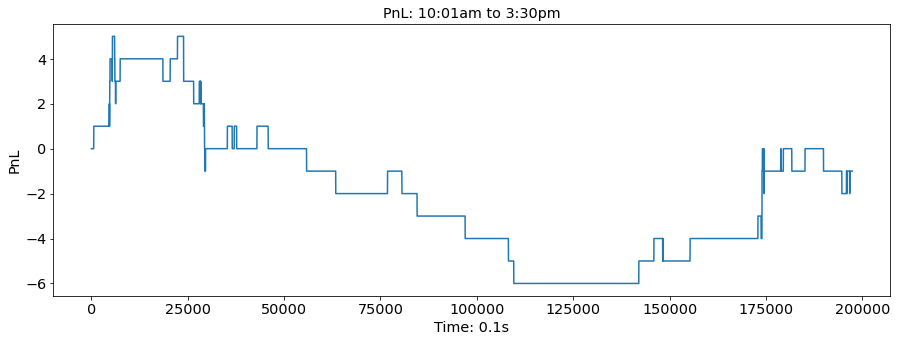

In [29]:
plt.plot(PnL)
plt.xlabel("Time: 0.1s")
plt.ylabel("PnL")
plt.title("PnL: 10:01am to 3:30pm")

In [30]:
Sharpe_ratio = np.mean(np.diff(PnL))/np.std(np.diff(PnL))
annualized_sr = Sharpe_ratio*np.sqrt(250*len(PnL))

In [31]:
print("Shape Ratio", Sharpe_ratio)
print("Annualized Sharpe Ratio", annualized_sr)

Shape Ratio -0.0002532280403153081
Annualized Sharpe Ratio -1.7789247302951046
